# 1. 本ノートブックの目的

原子分解能像から原子位置を推定し、周辺の原子の配位を取り扱う方法を示す。

# 2. 前提条件

もし付属のdockerfileを使う場合は、imageを走らせるときに、port 8888をコンテナのport8888に接続すること

以下はコンテナを使わずに環境を作る場合の手順

* Python ver 3.11以上を推奨(pyproject.tomlを使用している観点から)
* 以下のライブラリをpipでインストール
    * Cython numpy (ipywidgets #もしJupyter Notebookで動かす場合)
    * `pip install Cython numpy ipywidgets`
* gitを使って伊東が保守したパッケージをダウンロード
    * `git clone https://github.com/yutoml/MaximaFinder.git`
    * `git clone https://github.com/yutoml/stemtool.git`
    * 本家のパッケージはメンテナンス不足のため動作不良が多い
    * 伊東の編集したパッケージはpython3.10以上に対応しちょっと便利にもなっている
* ダウンロードしたパッケージをpipでインストール
    * `pip install stemtool/ MaximaFinder/`

In [1]:
from stemtool import afit
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import os

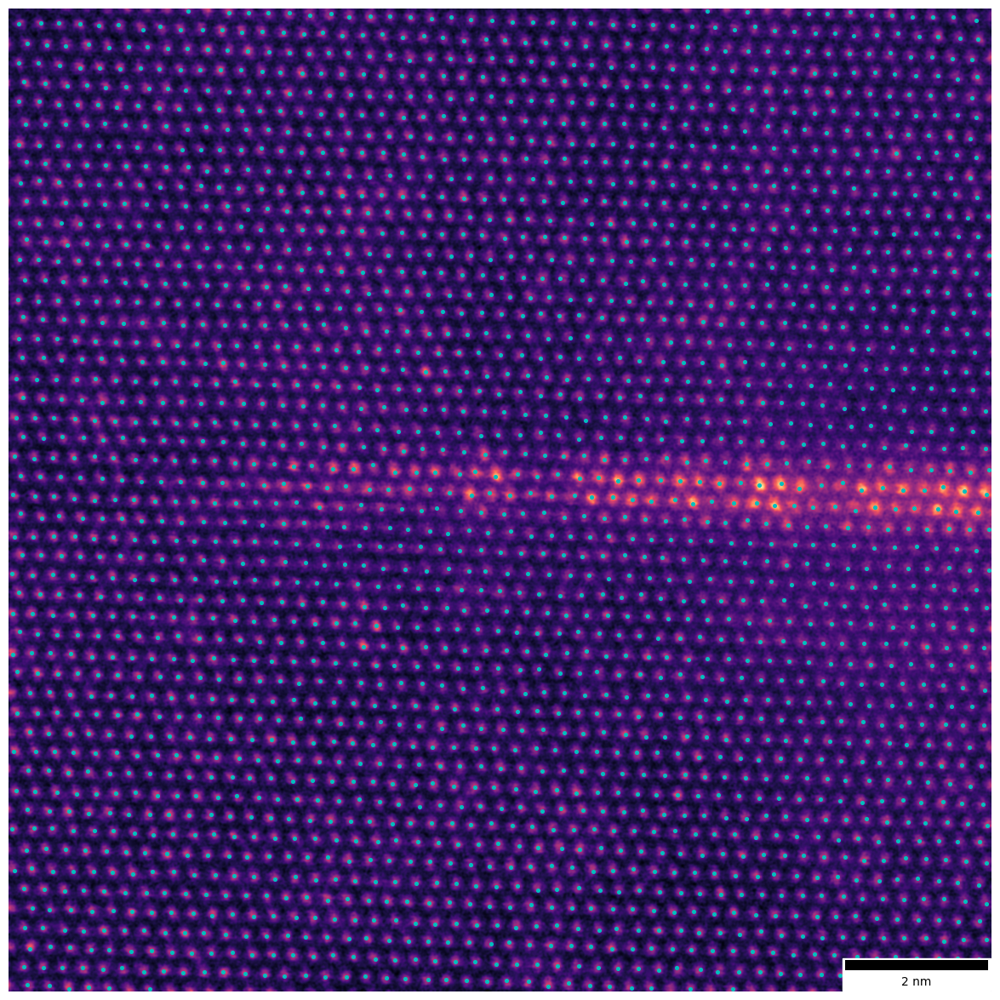

In [2]:
stem_image = np.array(Image.open('test_2.tif'))

# calibは1 pixあたりの長さの値を与える
# calib_unitsは1 pixあたりの長さの値の単位
atoms = afit.atom_fit(stem_image, calib=1/149.0701, calib_units='nm')
# method="fm2d"はMaximaFinderを使用して、原子位置を大まかに求める
# method="skfeat"はMaximaFinderではなくskimage.featureを使用する。
# どちらでも動くが、前者の方がピークの相対的な山の高さをみるが、後者は絶対的な高さを見る。(バッググラウンドの影響を受ける)
atoms.find_initial_peak(dist=0.2, thresh=0.1, method="fm2d")

atoms.peaks_vis()

何度かパラメータを変更して、大まかに原子位置の検出が完了したのちに、ガウシアンフィッティングを行ってpeak位置の調整を行う。

atoms.mpfitを使用すると、複数回のガウシアンフィッティングを行い、各ガウシアンフィッティングのピーク強度による加重平均を使用して、peak位置を求める。

peak_runsが一つのピークに使用するガウシアンフィッティングの回数を示し,1を渡せば、単純なガウシアンフィッティングとなる。

cut_pointは次のように説明される

>Ratio of distance to the median inter-peak distance. Only Gaussian peaks below this are used for the final estimation

md_scaleは一つのピークのフィッティングの際に切り出される、ピーク周辺の矩形領域の大きさを決める。矩形領域は正方形であり、一片の長さはピーク間距離×md_scaleの値となる。

parallel calc ready, max_workers = 8


parallel calc started: 100%|██████████| 2411/2411 [06:04<00:00,  6.61it/s]


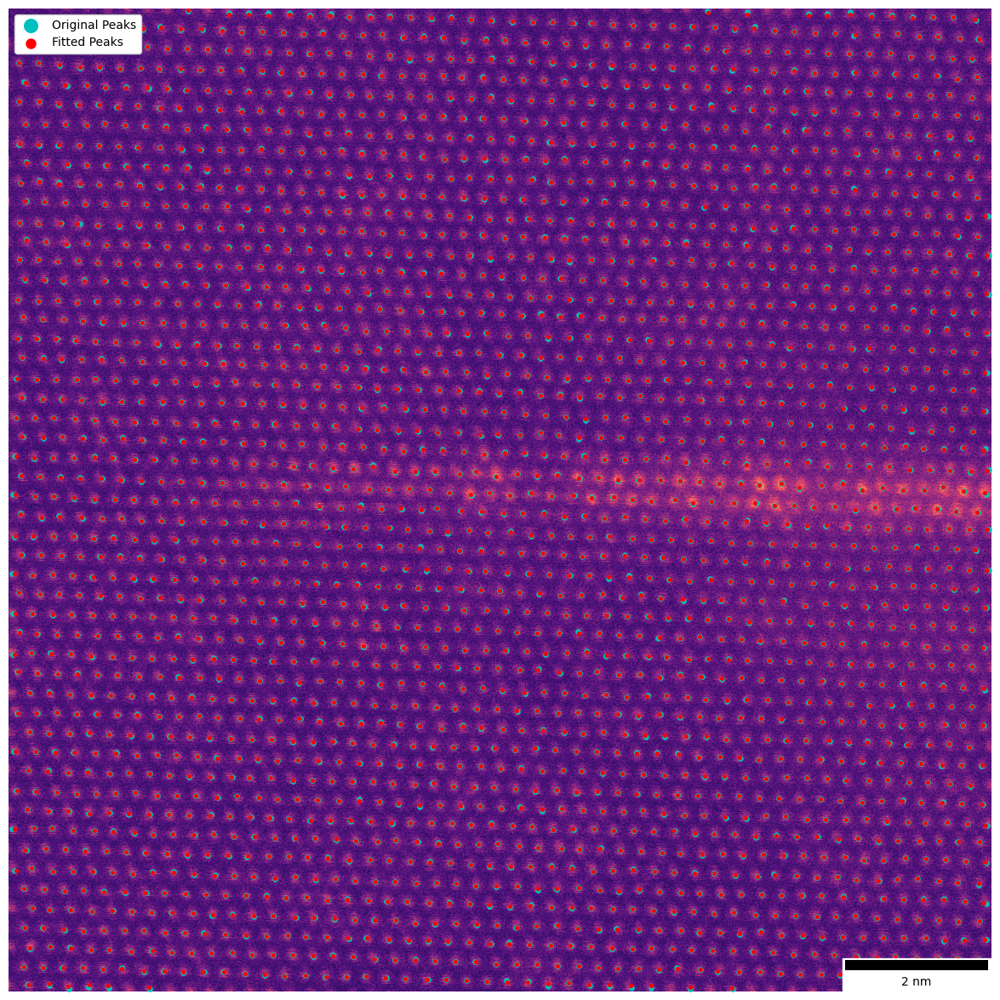

In [10]:
result = atoms.mpfit(peak_runs=6, cut_point=1/3, md_scale=1,use_filtered=True)
atoms.show_peaks()

上記の計算後、peak位置の決定が十分であれば、次に配位環境の解析を行う。

2Dのデータしかないため、3Dを取り扱う分子動力学法と異なり解析が難しい。
解析手法に関してはOvitoのページがよくまとまっている[Ovito : Modifiers/Identification](https://www.ovito.org/manual_testing/reference/pipelines/modifiers/index.html#:~:text=Structure%20identification)

まず近接peakを求める。
atoms.refined_peaks.calc_neighbersメソッドを実行すると、上記までで求めたピーク位置を使用して、最近接peakを求める。

引数thresholdは最近接peakとみなす距離の閾値を決める。

divisionはピークをthresholdの大きさを持つ四角形の領域にグループ分けしてから近接peakを求めるか否かを決める。グループ分けした場合は、注目するピークが含まれるグループと隣接するグループ8つに含まれるピークに対して距離の計算が行われる。
divisionの値はTrueかFalseをとる。Falseの場合、ピーク数をNとしたとき N!回、距離を計算することになるが、Trueの場合、L個のグループにそれぞれM個原子が入っていた場合(N=L×M)、~L×(9M)!回の計算が必要になる。
ピーク数が大きい場合は高速化が期待されるが、そうでなければグループ分けの計算量によるデメリットの方が大きい。

2411ピークが含まれている場合、division = Falseでは5.6s, Trueでは0.1秒で近接peakの分類が完了する

関数atoms.refined_peaks.calc_neighbersは各peakに対する近接peakの数のリストを返す。
ここではヒストグラムを表示して、近接peakの数が6つであるpeakの数が最大になるようにthresholdを調整する。

Average_neighbers_num : 5.82911654914973
2411
[4, 2, 4, 4, 4, 4, 4, 4, 2, 5, 5, 4, 3, 5, 6, 4, 6, 4, 6, 6, 4, 4, 6, 4, 6, 6, 4, 4, 6, 4, 6, 6, 4, 4, 6, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 2, 5, 2, 5, 5, 4, 3, 5, 4, 6, 6, 4, 6, 4, 4, 6, 6, 4, 6, 4, 4, 6, 3, 6, 3, 5, 3, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 3, 5, 3, 6, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 3, 3, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,

(array([   0.,    0.,    8.,   51.,   80.,   67., 2205.,    0.,    0.]),
 array([0., 1., 2., 3., 4., 5., 6., 7., 8., 9.]),
 <BarContainer object of 9 artists>)

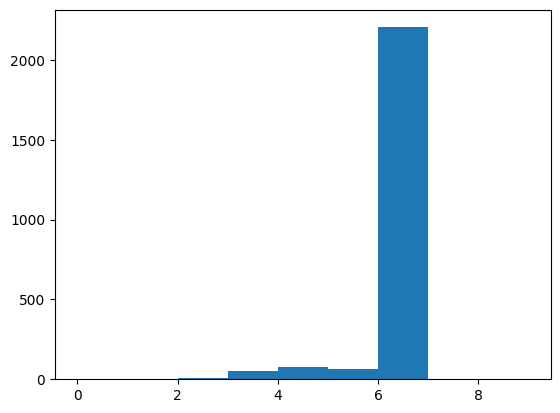

In [17]:
neighbers_count = atoms.refined_peaks.calc_neighbers(threshold=60,division=True) # 50 pix以内のピークを最近接原子とみなして計算。
plt.hist(neighbers_count,bins=range(0,10,1))

またpeakの解析の例として、近接peak数の分布を表示する。

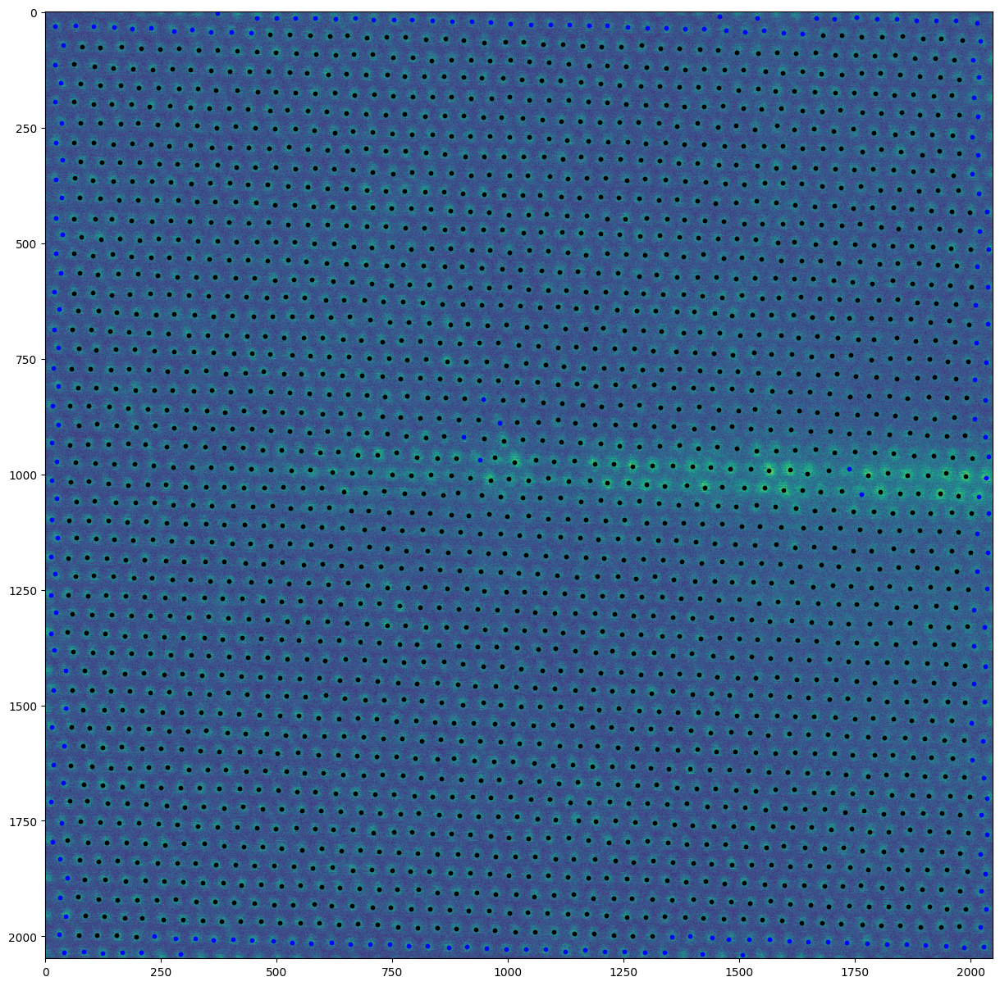

In [12]:
plt.figure(figsize=(15,15))
plt.imshow(stem_image)
spot_size = 10
for target in atoms.refined_peaks:
    if len(target.neighbers) == 6:
        plt.scatter(target.x,target.y, c = "black", s = spot_size)
    elif len(target.neighbers) > 6:
        plt.scatter(target.x,target.y, c = "red", s = spot_size)
    else:
        plt.scatter(target.x,target.y, c = "blue", s = spot_size)

また別の例として、あるpeakとそのpeakの近接peakを表示する。

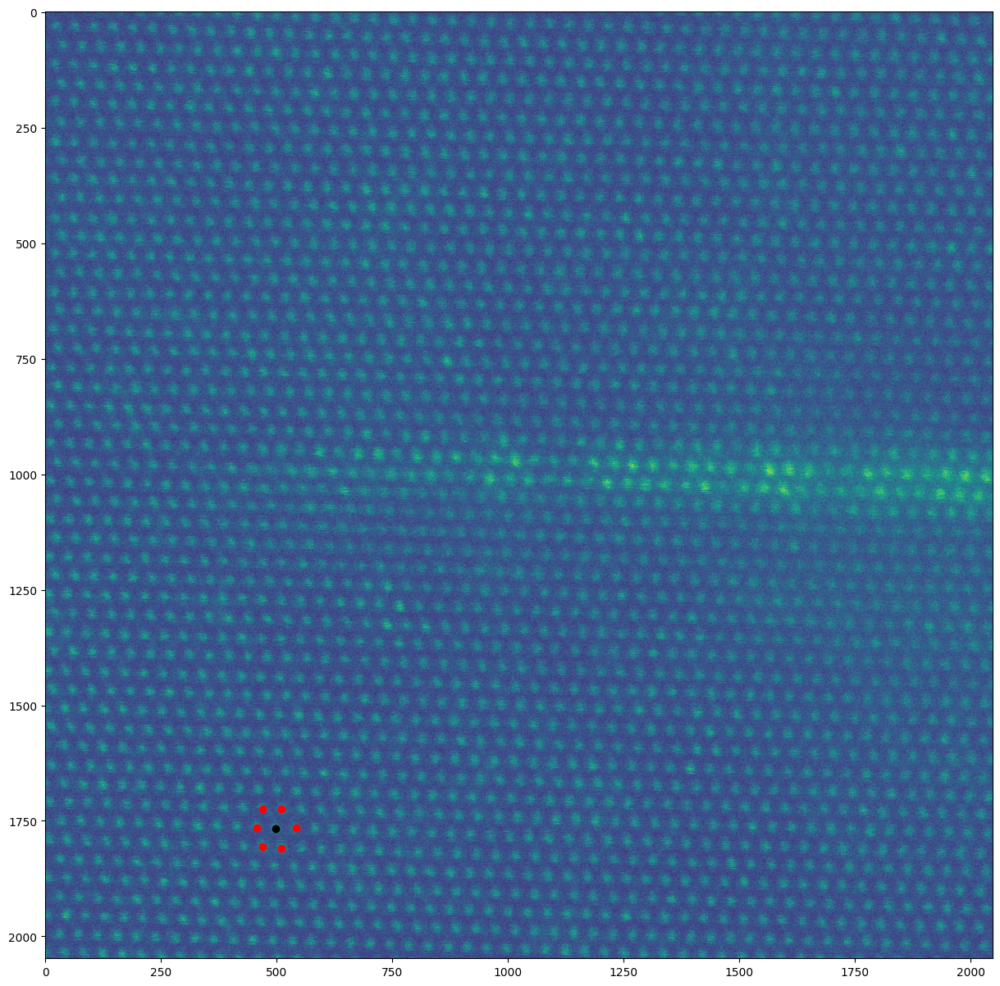

In [13]:
plt.figure(figsize=(15,15))
plt.imshow(stem_image)
target = atoms.refined_peaks[2056] # 代表として2056番目の原子をピックアップ
plt.scatter(target.x, target.y, c="black") # 2056番目の原子を黒で表示
for other in target.neighbers: # 2056番目の原子の最近接原子を赤で表示
    plt.scatter(other.x, other.y, c="red")

近接peakを求め終わったら、次に中心対称性パラメータを利用して計算を行う[参考](https://www.ovito.org/docs/current/reference/pipelines/modifiers/centrosymmetry.html)
対称性が良いほど$P_{csp}$の値は小さくなり、下の例ではより黒い丸として表示されるはず

しかし現実にはうまく分類はできておらず、hcpとfccの分類には[Ackland-Jones analysis](https://www.ovito.org/manual_testing/reference/pipelines/modifiers/bond_angle_analysis.html)などほかの方法を使うなどのさらなる工夫が必要と思われる。

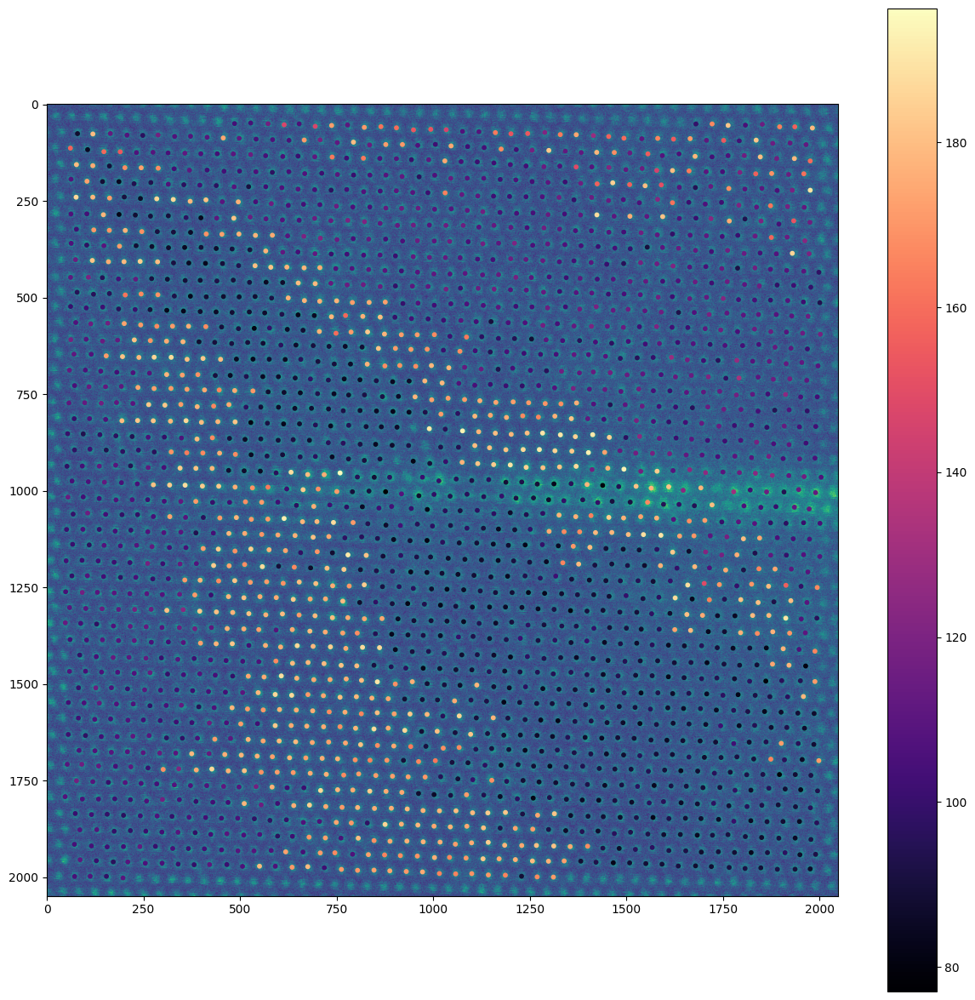

In [15]:
plt.figure(figsize=(15,15))
plt.imshow(stem_image)
x,y,c = [],[],[]
for target in atoms.refined_peaks:
    if len(target.neighbers) < 6: # 最近接原子が6つ以下の場合は、処理をしない
        continue
    # 最近接原子を6時方向から時計回りにソートする
    most_close_6_neighbers = sorted([peak for peak in target.neighbers], key= lambda x: target.get_distance(x))[:6]
    most_close_6_neighbers.sort(key=lambda x: np.arctan2(x.y,x.x))
    
    p_csp = np.sum([
        np.linalg.norm([
            most_close_6_neighbers[i].x + most_close_6_neighbers[i+3].x - 2*target.x,
            most_close_6_neighbers[i].y + most_close_6_neighbers[i+3].y - 2*target.y]) for i in range(3)])
    
    x.append(target.x)
    y.append(target.y)
    c.append(p_csp)
plt.scatter(x,y, c = c, cmap= "magma", s=spot_size)
plt.colorbar()